# Autophagy multi-class classifier (Case 1)

<b> What is our goal now? <b>

The main goal is to develop a model that has meaningful uncertainty, meaning the uncertainty is low for known and biologically uninteresting classes, but high for unknown and ideally biologically interesting classes. Our hope would be that this new model learns something the original classifier (autophagy_2_1 from SPACRSpy) did not, thereby identifying something new.
The way to test this for the multi-class classifier is by leaving out different biological conditions during training and then checking uncertainty on them as well as by evaluate the new model with screening data, plotting its 8th layer in UMAP and investigating the classifcation scores between the old and new models.

<b> What are we doing in this section? <b>

1. Read in and briefly investigate the new data
2. Rotate train and test data groups while checking the uncertainty
3. Turn binary clasifier into a multi-class classifier by doing the following:
* modify model output layer to e.g. softmax from sigmoid
* use Cross Entropy loss (as already done actually...)
* update ground truth labels to represent the class indices instead of binary values
* update evaluation metrics and data loader and specificy number of classes as variable

4. Evaluate model with screening data in the confusion matrix and plot 8th layer in UMAP
5. Plot and compare classification scores between old autophagy_2_1 model and new multiclass model
6. Evaluate model again but this time using balanced test set containing all biological classes


<b> What data do we have now? <b>

We now have image data on:
1. Stimulated 14h (or 16h)
2. Unstimulated
3. ATG5 KO (stimulated but that doesn’t matter, this KO supersedes the stim status [probably looks like unstimulated data])
4. Stimulated timecourse data
5. EI24 KO timecourse data

We can think of timeseries as follows: 1h unstim -> more and more vesicle formation -> 15h stimulated. Btw, EI24 (EI24 Autophagy Associated Transmembrane Protein) is a gene which induces apoptosis. 

Data can be found here:

* (1. - 4.) has already been loaded and used before
* Screen single cell images from 6 different slides are here: /dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/231004_autophagy_screen_6slides/
* Three replicates of single cell image EI24 KO timecourse data are now in /dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/231018_EI24_timecourse_phenix

Description of the EI24KO HDF5 files:

These files contain information about cells recorded at different timepoints, however the cells are fixed at each timepoint so we don’t have single cell information across timepoints. For the EI24 KO the last timepoint would be most relevant.

-> Keys: <KeysViewHDF5 ['label_names', 'single_cell_data', 'single_cell_index', 'single_cell_index_labelled']>

* label_names describes the columns of single_cell_index_labelled
* single_cell_data contains the single cell images with the same five channels as always
* single_cell_index two column table of indexed cell ids.
* single_cell_index_labelled information about each cell [b'index', b'cellid', b'ID', b'location', b'timepoint', b'well', b'region', b'Genotype', b'Condition']

## Notebook overview

* [I. Read in new data and create data object HDF5SingleCellDataset](#vis)
* [II. Train multi-class classifier and monitor performance with wandb](#multi)   
* [III. Binary VGG-like classifier from SPARCSpy -> multi-class classifier with same architecture](#multiclass)
* [IV. Evaluate model with screening data in the confusion matrix and plot 8th layer in UMAP](#eval)
* [V. Calculate Classification scores for a) MultiClassClassifier and b) Original autophagy_classifier_2_1 for comparison](#scores)
* [VI. Evaluate model and calculate classification scores on balanced test set containing all biological classes](#bioclasses)

## I Read in new data and create data object HDF5SingleCellDataset  <a class="anchor" id="vis"></a>

In [1]:
import h5py
import matplotlib.pyplot as plt

num_channels = 5

channel_info = {
    1: "mask nucleus",
    2: "mask cytosol",
    3: "img nucleus",
    4: "img membrane",
    5: "img LC3"
}

In [2]:
#stimulates timeseries class 3
stim_timeseries_hdf5_path = '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_01_stim_Cr203_C6_filtered.h5'
stim_timeseries_hdf5 = h5py.File(stim_timeseries_hdf5_path, "r")
stim_timeseries_hdf5.keys()

<KeysViewHDF5 ['annotation', 'single_cell_data', 'single_cell_index']>

In [2]:
#screening 6 slides
stim_timeseries_hdf5_path = "/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/231004_autophagy_screen_6slides/2.3_A002/single_cells.h5"
stim_timeseries_hdf5 = h5py.File(stim_timeseries_hdf5_path, "r")
stim_timeseries_hdf5.keys()

<KeysViewHDF5 ['single_cell_data', 'single_cell_index']>

In [6]:
stim_imeseries_index_hdf5 = stim_timeseries_hdf5["single_cell_index"][:]
stim_timeseries_cells_hdf5 = stim_timeseries_hdf5["single_cell_data"][0:100, :]
stim_imeseries_annot_hdf5 = stim_timeseries_hdf5["annotation"][:]

print(stim_imeseries_annot_hdf5)

[[b'162409' b'0' b'1']
 [b'393744' b'3' b'1']
 [b'129111' b'15' b'1']
 ...
 [b'485066' b'505306' b'1']
 [b'241830' b'505312' b'1']
 [b'73660' b'505315' b'1']]


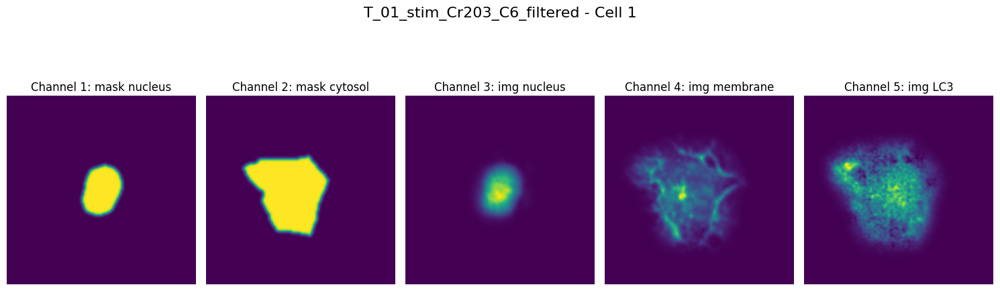

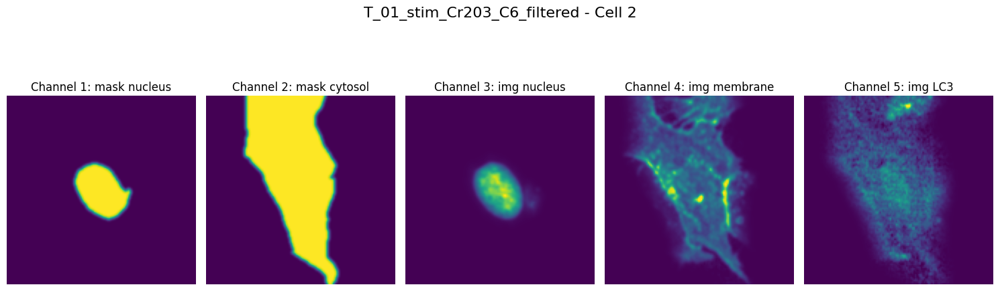

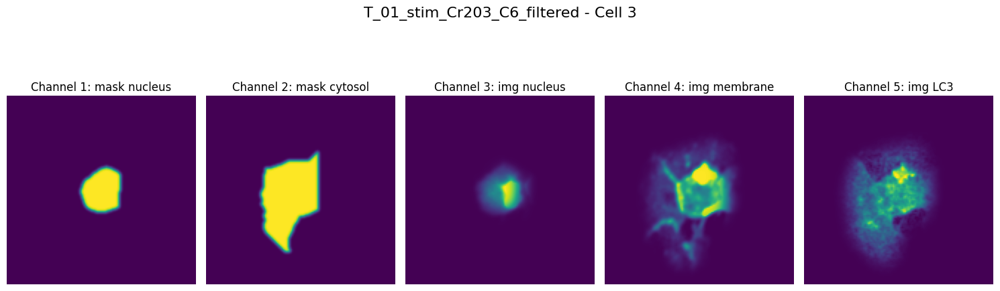

In [9]:
num_cells = 3  
num_channels = stim_timeseries_cells_hdf5[0].shape[0]  

# Create a figure for each cell
for cell_idx in range(num_cells):
    fig, axes = plt.subplots(1, num_channels, figsize=(15, 5))  
    for channel in range(num_channels):
        # Plot the timeseries for each channel
        axes[channel].imshow(stim_timeseries_cells_hdf5[cell_idx][channel])
        axes[channel].set_title(f"Channel {channel+1}: {channel_info[channel+1]}")
        axes[channel].axis('off')
    
    plt.tight_layout()
    
    # Main title for each cell
    main_title = f"T_01_stim_Cr203_C6_filtered - Cell {cell_idx+1}"
    plt.suptitle(main_title, fontsize=16, y=1.05)
    
    plt.show()

In [5]:
# El24 KO timecourse
El24_KO_hdf5_path = "/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/231018_EI24_timecourse_phenix/231018_0316_EI24_fixed_tc/single_cells.h5"
El24_KO_hdf5 = h5py.File(El24_KO_hdf5_path, "r")
El24_KO_hdf5.keys()

<KeysViewHDF5 ['label_names', 'single_cell_data', 'single_cell_index', 'single_cell_index_labelled']>

In [6]:
El24_KO_timeseries_index_hdf5 = El24_KO_hdf5["single_cell_index"][:]
El24_KO_timeseries_cells_hdf5 = El24_KO_hdf5["single_cell_data"][0:100, :]

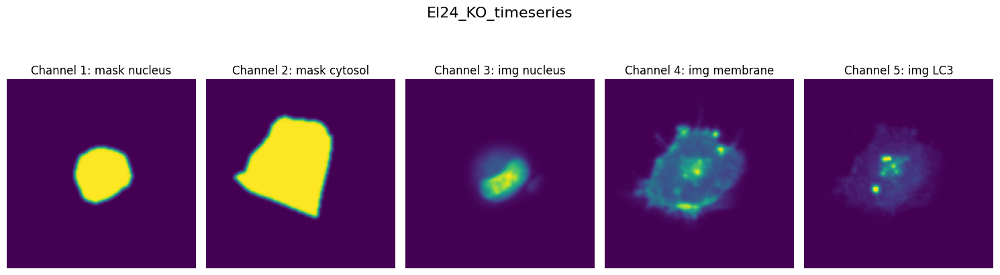

In [7]:
# Create a figure with subplots for each channel
fig, axes = plt.subplots(1, num_channels, figsize=(15, 5))

for channel in range(num_channels):
    axes[channel].imshow(El24_KO_timeseries_cells_hdf5[0][channel])
    axes[channel].set_title(f"Channel {channel+1}: {channel_info[channel+1]}")
    axes[channel].axis('off')
plt.tight_layout()
main_title = "El24_KO_timeseries"
plt.suptitle(main_title, fontsize=16, y=1.)
plt.show()

## II.  Train multi-class classifier and monitor performance with wandb <a class="anchor" id="multi"></a>

In [1]:
!pip install torch-intermediate-layer-getter
!pip install umap-learn
!pip install leidenalg
!pip install scanpy==1.9.6
!pip install anndata umap-learn

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     |████████████████████████████████| 2.0 MB 2.9 MB/s eta 0:00:01
     |████████████████████████████████| 128 kB 16.3 MB/s eta 0:00:01
     |████████████████████████████████| 10.8 MB 24.7 MB/s eta 0:00:01
     |████████████████████████████████| 233 kB 112.7 MB/s eta 0:00:01
     |████████████████████████████████| 79 kB 160.2 MB/s eta 0:00:01
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl s

In [2]:
import os
import wandb
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from tqdm.notebook import tqdm
import pandas as pd
import torch
from torch.utils.data import DataLoader, random_split, SubsetRandomSampler
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, balanced_accuracy_score
import sys
import seaborn as sn
from torch.utils.tensorboard import SummaryWriter
from torch_intermediate_layer_getter import IntermediateLayerGetter as MidGetter
import umap
import scanpy as sc
import anndata as ad
import pickle

from sparcscore.ml.datasets import HDF5SingleCellDataset
#from sparcscore.pipeline.project import TimecourseProject, Project
#from sparcscore.pipeline.workflows import MultithreadedWGATimecourseSegmentation, WGATimecourseSegmentation, MultithreadedCytosolCellposeTimecourseSegmentation, ShardedWGASegmentation, ShardedDAPISegmentationCellpose, WGASegmentation, DAPISegmentationCellpose
from sparcscore.pipeline.extraction import HDF5CellExtraction, TimecourseHDF5CellExtraction
from sparcscore.pipeline.classification import MLClusterClassifier
from sparcscore.ml.pretrained_models import autophagy_classifier2_1

## III.  Binary VGG-like classifier from SPARCSpy -> multi-class classifier with same architecture <a class="anchor" id="multiclass"></a>

In [3]:
class MultiClassClassifier(nn.Module):
    def __init__(self, num_classes):
        super(MultiClassClassifier, self).__init__()
        
        # VGG-like feature extractor
        self.features = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        
        # Classifier head for multi-class
        self.fc_input_size = 8192 
        self.classifier = nn.Sequential(
            nn.Linear(self.fc_input_size, 4096), 
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(4096, 1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(1024, num_classes) 
        )

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        
        # Print the size of x to confirm it's correct
        #print("Size of x:", x.size())
        
        x = self.classifier(x)
        return x

# Create an instance of the model
num_classes = 5 
model = MultiClassClassifier(num_classes)
print(model)

MultiClassClassifier(
  (features): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (

We specifically want the following scenarios:

train | test

* 1,3 | 2 [Case 1]
* 1,3 | 4 [Case 2]
* 1,3 | 5 [Case 3]
* 1,2,3 | 4 [Case 4]
* 1,2,3 | 5 [Case 5]
* 1,2,3,4 | 5 (advantage is that 4 and 5 have a batch effect vs the others that can be learned by including 4. use only final timepoint of 4?) [Case 6]

In the following we focus on Case 1.

We set labels as follows in our following hdf5 data objects: 

* Stimulated 14h (or 16h) -> (1)
* Unstimulated -> (2)
* ATG5 KO -> (3)
* Stimulated timecourse -> (4)
* EI24 KO timecourse data -> (5)

### Case 1 (use 0,2 for training, and 1 for testing)

In [23]:
case1_hdf5_train_data = HDF5SingleCellDataset(
    dir_list=['/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_01_stim_Cr203_C6_filtered.h5', 
              '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_01_stim_wt_filtered.h5', 
              '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_02_stim_Cr203_C6_filtered.h5',
              '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_02_stim_wt_filtered.h5',
              '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_2.2_stim_Cr203_filtered.h5',
              '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_2.2_stim_wt_filtered.h5',
              '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_2.3_stim_Cr203_filtered.h5',
              '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_2.3_stim_wt_filtered.h5'],
    dir_labels=[2, 0, 2, 0, 2, 0, 2, 0], 
    root_dir='/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/',
    select_channel=4,  # Select the 5th channel (channel index 4)
    return_id=False
)

Total: 800000
0: 400000
2: 400000


In [24]:
case1_hdf5_test_data = HDF5SingleCellDataset(
    dir_list=['/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_01_unstim_wt_filtered.h5',
             '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_02_unstim_wt_filtered.h5',
                            '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_2.X_stim_Cr203_filtered.h5',
              '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_2.X_stim_wt_filtered.h5'
             ],
    dir_labels=[1,1,2,0], 
    root_dir='/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/',
    select_channel=4,  # Select the 5th channel (channel index 4)
    return_id=False
)

Total: 400000
0: 100000
1: 200000
2: 100000


We want some of class 1 and around 20% of class 2 and class 0 in the test set.

### Run multi-class classifier on case 1

In [ ]:
# Redirect print statements to file
sys.stdout = open("duplicate_multi_class_output.txt", "w")

# Log into W&B
wandb.login()
run = wandb.init(project="VGG2_autophagy_multi_class_training")

# Create an instance of the Multi-Class Classifier model on the selected device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
num_classes = 3
model = MultiClassClassifier(num_classes)
model.to(device)
loss_function = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10 
batch_size = 256 
log_interval = 50  # Log metrics every 50 batches

epsilon = 1e-8  # Small epsilon value to prevent log(0) in uncertainties

# Set train and test data based on the scenario
train_data = case1_hdf5_train_data
test_data = case1_hdf5_test_data

# Create DataLoaders
train_data_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_data_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)

stop_training = False

for epoch in range(1, num_epochs + 1):
    if stop_training:
        break  
    
    print("Epoch: ", epoch)
    model.train()  # training mode set

    total_loss = 0.0
    correct = 0
    total_samples = len(train_data)
    batch_counter = 0  # Reset batch counter at the start of each epoch

    for batch_idx, (data, labels) in enumerate(train_data_loader):
        data = data.to(device)
        labels = labels.to(device)

        optimizer.zero_grad() 
        output = model(data) 
        loss = loss_function(output, labels) 
        loss.backward()
        optimizer.step()

        total_loss += loss.sum().item()
        _, predicted = output.max(1)
        correct += predicted.eq(labels).sum().item()

        batch_counter += 1
        
        # Calculate accuracy and average loss for the current batch
        accuracy = 100.0 * correct / (batch_counter * batch_size)
        average_loss = total_loss / (batch_counter * batch_size)

        # Check for the desired accuracy and stop training if reached
        if accuracy >= 99.0:
            stop_training = True
            print("Accuracy over 99% reached and thus stopping training...")
            break

        # Calculate class probabilities
        probs = torch.nn.functional.softmax(output, dim=1)

        # Calculate uncertainties (entropy) for each class
        uncertainties = [-torch.sum(p * torch.log(p + epsilon)) for p in probs]

        # Store uncertainties for each class
        all_class_uncertainties = []
        for i in range(num_classes):
            class_uncertainty = uncertainties[i].detach().cpu().numpy()
            all_class_uncertainties.append(class_uncertainty)

    # Calculate precision, recall, and F1-score for the entire training dataset at the end of the epoch
    all_train_labels = []
    all_train_predicted = []

    for data, labels in train_data_loader:
        data = data.to(device)
        labels = labels.to(device)

        output = model(data)
        _, predicted = output.max(1)
        all_train_labels.extend(labels.cpu().numpy())
        all_train_predicted.extend(predicted.cpu().numpy())

    train_precision = precision_score(all_train_labels, all_train_predicted, average='macro')
    train_recall = recall_score(all_train_labels, all_train_predicted, average='macro')
    train_f1 = f1_score(all_train_labels, all_train_predicted, average='macro')
    train_balanced_accuracy = balanced_accuracy_score(all_train_labels, all_train_predicted)

    # Calculate training accuracy
    train_accuracy = accuracy_score(all_train_labels, all_train_predicted) * 100.0

    print("Train Precision: " + str(train_precision) + " Recall: " + str(train_recall) + " F1 score: " + str(train_f1))
    print("Train Balanced Accuracy: {:.2f}%".format(train_balanced_accuracy))
    
    # Log train metrics for the epoch, including accuracy and loss
    wandb.log({
        "Train Epoch": epoch,
        "Train_Precision": train_precision,
        "Train_Recall": train_recall,
        "Train_F1-score": train_f1,
        "Train_Balanced_Accuracy": train_balanced_accuracy,
        "Train_Loss": average_loss,
    })

    # Reset correct and total_loss at the beginning of each epoch
    correct = 0
    total_loss = 0.0

    # Evaluate the model on the test set after each epoch
    model.eval()
    test_correct = 0
    test_average_loss = 0.0
    test_batch_counter = 0
    all_test_labels = []
    all_test_predicted = []

    for data, labels in test_data_loader:
        data = data.to(device)
        labels = labels.to(device)

        output = model(data)
        _, predicted = output.max(1)
        test_correct += predicted.eq(labels).sum().item()
        all_test_labels.extend(labels.cpu().numpy())
        all_test_predicted.extend(predicted.cpu().numpy())

        loss = loss_function(output, labels)
        test_average_loss += loss.sum().item()
        test_batch_counter += 1

    # Calculate and write class uncertainties for the entire test dataset to a file
    test_class_uncertainties = [[] for _ in range(num_classes)]  # Initialize uncertainties for each class

    for data, labels in test_data_loader:
        data = data.to(device)
        labels = labels.to(device)

        output = model(data)

        # Calculate class probabilities
        probs = torch.nn.functional.softmax(output, dim=1)

        # Calculate uncertainties (entropy) for each class
        uncertainties = [-torch.sum(p * torch.log(p + epsilon)) for p in probs]

        # Store uncertainties for each class
        for i in range(num_classes):
            class_uncertainty = np.mean(uncertainties[i].detach().cpu().numpy())
            test_class_uncertainties[i].extend([class_uncertainty])

    # Save class uncertainties to a file
    print("Writing to file now...")
    with open(f'class_uncertainties_epoch{epoch}.txt', 'w') as f:
        for i in range(num_classes):
            f.write(f'Class {i} Uncertainty: {np.mean(test_class_uncertainties[i])}\n')
            
    # Plot histogram of uncertainties for class 1
    class1_uncertainties = test_class_uncertainties[1]
    plt.hist(class1_uncertainties, bins=50, alpha=0.5, color='blue', label='Class 1 Uncertainties')
    plt.xlabel('Uncertainty')
    plt.ylabel('Frequency')
    plt.title('Uncertainty Distribution for Class 1')
    plt.legend()
    plt.savefig(f'uncertainty_histogram_class1_epoch{epoch}.png')
    plt.close()

    # Calculate confusion matrix and performance metrics for class 2
    true_labels = all_test_labels  # These are all class 2
    predicted_labels = all_test_predicted

    confusion = confusion_matrix(true_labels, predicted_labels)
    print("Confusion Matrix:")
    print(confusion)
    with open("duplicate_confusion_matrix.txt", "w") as f:
        f.write("Confusion Matrix:\n")
        f.write(np.array2string(confusion, separator=', '))

# Save model
print("Saving final model now...")
torch.save(model.state_dict(), 'multi_class_VGG2_case1.pth')

# Close the W&B run
wandb.finish()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: marunku (crisprscreen). Use `wandb login --relogin` to force relogin


This code calculates and logs uncertainties for each class by computing the entropy of class probabilities and stores these values in separate logs with class-specific names. This way, we can analyze uncertainties for each class individually.

When a model encounters samples it hasn't been trained on, it might produce more uncertain predictions. The softmax probabilities reflect the model's confidence in its predictions, and if it hasn't seen class 2 in the training data, it might assign low probabilities to that class.

For test set we are not intersted in the metrics, instead we only want the uncertainty of the classifier and here also batch size is set to 128.

### With dropout at test time

In [ ]:
# Seed for reproducibility
seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

# Redirect print statements to a file
sys.stdout = open("duplicate_multi_class_output.txt", "w")

# Initialize TensorBoard writer
tensorboard_writer = SummaryWriter('runs/VGG2_autophagy_multi_class_training')

# Log into W&B
wandb.login()
run = wandb.init(project="VGG2_autophagy_multi_class_training")

# Define the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Create an instance of model
num_classes = 3
model = MultiClassClassifier(num_classes)
model.to(device)

# Define the loss function and optimizer
loss_function = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 5  
batch_size = 256 
log_interval = 50  # Log metrics every 50 batches

epsilon = 1e-8  # Small epsilon value to prevent log(0) in uncertainties

# Set train and test data based on the scenario
train_data = case1_hdf5_train_data
test_data = case1_hdf5_test_data

# Create DataLoaders
train_data_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_data_loader = DataLoader(test_data, batch_size=batch_size, shuffle=True)

stop_training = False

# Training loop
for epoch in range(1, num_epochs + 1):
    if stop_training:
        break  
    
    print("Epoch: ", epoch)
    model.train()  # Set model to training mode

    total_loss = 0.0
    correct = 0
    total_samples = len(train_data)
    batch_counter = 0  # Reset batch counter at the start of each epoch

    for batch_idx, (data, labels) in enumerate(train_data_loader):
        data = data.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = loss_function(output, labels)
        loss.backward() 
        optimizer.step()

        total_loss += loss.sum().item()
        _, predicted = output.max(1)
        correct += predicted.eq(labels).sum().item()

        batch_counter += 1
        
        # Calculate accuracy and average loss for the current batch
        accuracy = 100.0 * correct / (batch_counter * batch_size)
        average_loss = total_loss / (batch_counter * batch_size)

        # Check for the desired accuracy and stop training if reached
        if accuracy >= 99.0:
            stop_training = True
            print("Accuracy over 99% reached and thus stopping training...")
            break

    # Calculate and log training metrics
    all_train_labels = []
    all_train_predicted = []

    for data, labels in train_data_loader:
        data = data.to(device)
        labels = labels.to(device)

        output = model(data)
        _, predicted = output.max(1)
        all_train_labels.extend(labels.cpu().numpy())
        all_train_predicted.extend(predicted.cpu().numpy())

    train_precision = precision_score(all_train_labels, all_train_predicted, average='macro')
    train_recall = recall_score(all_train_labels, all_train_predicted, average='macro')
    train_f1 = f1_score(all_train_labels, all_train_predicted, average='macro')
    train_balanced_accuracy = balanced_accuracy_score(all_train_labels, all_train_predicted)

    train_accuracy = accuracy_score(all_train_labels, all_train_predicted) * 100.0

    print("Train Precision: " + str(train_precision) + " Recall: " + str(train_recall) + " F1 score: " + str(train_f1))
    print("Train Balanced Accuracy: {:.2f}%".format(train_balanced_accuracy))
    
    # Log train metrics for the epoch
    wandb.log({
        "Train Epoch": epoch,
        "Train_Precision": train_precision,
        "Train_Recall": train_recall,
        "Train_F1-score": train_f1,
        "Train_Balanced_Accuracy": train_balanced_accuracy,
        "Train_Loss": average_loss,
    })
    
    # Log on TensorBoard
    tensorboard_writer.add_scalar('Train_Precision', train_precision, global_step=epoch)
    tensorboard_writer.add_scalar('Train_Recall', train_recall, global_step=epoch)
    tensorboard_writer.add_scalar('Train_F1-score', train_f1, global_step=epoch)
    tensorboard_writer.add_scalar('Train_Balanced_Accuracy', train_balanced_accuracy, global_step=epoch)
    tensorboard_writer.add_scalar('Train_Loss', average_loss, global_step=epoch)

    correct = 0
    total_loss = 0.0

    # Test loop with dropout and aggregated confusion matrix
    model.eval()
    
    # Enable dropout during testing
    model.apply(lambda m: setattr(m, 'training', True))

    test_correct = 0
    test_average_loss = 0.0
    all_test_labels = []
    all_test_predicted = []
    test_class_uncertainties = [[] for _ in range(num_classes)]

    with torch.no_grad():
        for data, labels in test_data_loader:
            data = data.to(device)
            labels = labels.to(device)

            output = model(data)
            _, predicted = output.max(1)
            test_correct += predicted.eq(labels).sum().item()
            all_test_labels.extend(labels.cpu().numpy())
            all_test_predicted.extend(predicted.cpu().numpy())

            loss = loss_function(output, labels)
            test_average_loss += loss.sum().item()

            # Calculate class probabilities
            probs = torch.nn.functional.softmax(output, dim=1)

            # Calculate uncertainties (entropy) for each class
            uncertainties = [-torch.sum(p * torch.log(p + epsilon)) for p in probs]

            # Store uncertainties for each class
            for i in range(num_classes):
                class_uncertainty = np.mean(uncertainties[i].detach().cpu().numpy())
                test_class_uncertainties[i].extend([class_uncertainty])

    # Filter out predictions and labels for classes seen during training
    mask_seen_classes = np.isin(all_test_labels, [0, 2])  # Class 0 and 2 seen at training
    filtered_test_labels = np.array(all_test_labels)[mask_seen_classes]
    filtered_test_predicted = np.array(all_test_predicted)[mask_seen_classes]

    # Calculate accuracy and loss only for the seen classes
    test_accuracy = accuracy_score(filtered_test_labels, filtered_test_predicted)
    test_average_loss = test_average_loss / len(test_data)

    print("Test Accuracy: {:.2f}%".format(test_accuracy * 100))
    print("Test Loss: {:.4f}".format(test_average_loss))

    wandb.log({
        "Test_Accuracy": test_accuracy,
        "Test_Loss": test_average_loss,
    })

    tensorboard_writer.add_scalar('Test_Accuracy', test_accuracy, global_step=epoch)
    tensorboard_writer.add_scalar('Test_Loss', test_average_loss, global_step=epoch)
    
    
    # Aggregate and log confusion matrix
    aggregated_confusion = confusion_matrix(all_test_labels, all_test_predicted)

    # Confusion matrix
    epsilon = 1e-8
    df_cm = pd.DataFrame(aggregated_confusion / (np.sum(aggregated_confusion, axis=1)[:, None] + epsilon),
                         index=[i for i in range(num_classes)],
                         columns=[i for i in range(num_classes)])

    # Save confusion matrix to TensorBoard
    figure = sn.heatmap(df_cm, annot=True).get_figure()
    tensorboard_writer.add_figure(f'Aggregated Confusion Matrix - Epoch {epoch}', figure, global_step=epoch)
    
    # Set the model back to training mode
    model.train()
    
    # Plot histogram of uncertainties
    class1_uncertainties = test_class_uncertainties[1]
    plt.hist(class1_uncertainties, bins=50, alpha=0.5, color='blue', label='Class 1 Uncertainties')
    plt.xlabel('Uncertainty')
    plt.ylabel('Frequency')
    plt.title('Uncertainty Distribution for Class 1')
    plt.legend()
    plt.savefig(f'uncertainty_histogram_class1_epoch{epoch}.png')
    plt.close()

# Save model
print("Saving final model now...")
torch.save(model.state_dict(), 'multi_class_VGG2_case1.pth')

# Close the W&B run
wandb.finish()

# Close the TensorBoard writer
tensorboard_writer.close()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: marunku (crisprscreen). Use `wandb login --relogin` to force relogin


We apply dropout during test time and get batch-level information in confusion matrix instead of aggregating over all batches for more detailed understanding of the model's behavior.

## IV.  Evaluate model with screening data in the confusion matrix and plot 8th layer in UMAP <a class="anchor" id="eval"></a>

We want to include the unlabeled (like class 0 looking) screening data to our current test set to evaluate our fully trained model and plot the confusion matrix. We do not retrain at this point, we want to understand if the model is overfitting or not.

*Reminder*: In a confusion matrix, the rows typically represent the actual classes or ground truth labels, while the columns represent the predicted classes by the model.

In [3]:
case1_hdf5_test_data = HDF5SingleCellDataset(
    dir_list=['/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_01_unstim_wt_filtered.h5',
             '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_02_unstim_wt_filtered.h5',
                            '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_2.X_stim_Cr203_filtered.h5',
              '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/T_2.X_stim_wt_filtered.h5',
              '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/231004_autophagy_screen_6slides/2.3_F003/single_cells.h5'
             ],
    dir_labels=[1,1,2,0,3], 
    root_dir='/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93kux/230714_autophagy_training_data_sample/',
    select_channel=4,  # Select the 5th channel (channel index 4)
    return_id=False
)

Total: 758879
0: 100000
1: 200000
2: 100000
3: 358879


In [27]:
#Load pretrained model
num_classes = 3
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = MultiClassClassifier(num_classes)
model.load_state_dict(torch.load('multi_class_VGG2_case1.pth'))
model.to(device)
model.eval()

MultiClassClassifier(
  (features): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (

#### Evaluate with screening data

In [10]:
# Create DataLoader for test_data
batch_size = 256 
test_data_loader = DataLoader(case1_hdf5_test_data, batch_size=batch_size, shuffle=False)

# Initialize TensorBoard writer
tensorboard_writer = SummaryWriter('runs/VGG2_autophagy_confusion_matrix')

# Test loop
model.eval()
all_test_labels = []
all_test_predicted = []

with torch.no_grad():
    for data, labels in test_data_loader:
        data = data.to(device)
        labels = labels.to(device)

        output = model(data)
        _, predicted = output.max(1)
        all_test_labels.extend(labels.cpu().numpy())
        all_test_predicted.extend(predicted.cpu().numpy())

# Calculate  confusion matrix
confusion_matrix_result = confusion_matrix(all_test_labels, all_test_predicted)

# Print cm to console
print("Confusion Matrix:")
print(confusion_matrix_result)

# Save confusion matrix to TensorBoard
epsilon = 1e-8
num_classes = 4

class_names = ["Class 0 (Stim.)", "Class 1 (Unstim.)", "Class 2 (ATG5 K0)", "Screening"]
df_cm = pd.DataFrame(confusion_matrix_result / (confusion_matrix_result.sum(axis=1)[:, None] + epsilon),
                     index=class_names,
                     columns=class_names)

# Set figsize
plt.figure(figsize=(10, 8)) 

# Plot confusion matrix
sn.heatmap(confusion_matrix_result, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

# save confusion matrix to TensorBoard
tensorboard_writer.add_figure('Confusion Matrix', plt.gcf())

# save confusion matrix to file
df_cm.to_csv('confusion_matrix_case1_with_screendata.csv', index=True)

# Close TensorBoard writer aggain
tensorboard_writer.close()

Confusion Matrix:
[[ 99969      0     31      0]
 [ 71782      0 128218      0]
 [  5131      0  94869      0]
 [358365      0    514      0]]


#### Plot 8th layer

*Note*: We have to randomely subsample the dataset before plotting the 8th layer activations becuase it keeps crashing the kernals due to dataset being too large for memory (even after trying out different batch sizes, CPU/GPU architectures, number of workers, datasplits, etc.)

The activations variable contains the output activations of a specific layer from the  model. These activations represent the feature representations learned by the model in response to the input data. Each row in the activations array corresponds to the activations produced by the model for a particular input sample.

In [5]:
layer_name = 'features.24' # 8th layer activations name from model architecture

# define the return layers for IntermediateLayerGetter
return_layers = {layer_name: layer_name}

# Initialize the model with correct feature output
mid_getter = MidGetter(model, return_layers=return_layers, keep_output=True)

# Define the size of the subset!!! (not full dataset here due to kernal crahsing!)
subset_size = 7600 

# Create DataLoader
batch_size = 512
test_data_loader = DataLoader(case1_hdf5_test_data, batch_size=batch_size, shuffle=False)

# Randomly sample a subset of the dataset
subset_indices = torch.randperm(len(case1_hdf5_test_data))[:subset_size]
torch.save(subset_indices, 'Case_1_subset_indices.pth')
subset_indices = torch.load('Case_1_subset_indices.pth')

# Create a new subset sampler with the loaded indices
subset_sampler = SubsetRandomSampler(subset_indices)

# Create a new DataLoader for the subset
subset_data_loader = DataLoader(case1_hdf5_test_data, batch_size=batch_size, sampler=subset_sampler)

# Lists to store activations and labels
activations = []
labels = []

# Forward pass of subset through the model to get activations
with torch.no_grad():
    for data, label in tqdm(subset_data_loader, desc="Processing data", leave=False):
        data = data.to(device) 
        mid_outputs, _ = mid_getter(data)
        # Get the activations
        activations.append(mid_outputs[layer_name].cpu().detach().numpy())
        labels.append(label.numpy())

# Concatenate activations and labels from all batches
activations = np.concatenate(activations, axis=0)
labels = np.concatenate(labels, axis=0)

Processing data:   0%|          | 0/15 [00:00<?, ?it/s]

In [12]:
#save activations and labels to files
np.save('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/Case_1_junk_activations_layer_8.npy', activations)
np.save('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/Case_1_junk_labels_layer_8.npy', labels)

In [39]:
#lload activations and labels from files
activations = np.load('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/Case_1_junk_activations_layer_8.npy')
labels = np.load('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/Case_1_junk_labels_layer_8.npy')
labels

array([1, 2, 0, ..., 1, 3, 0])

In [40]:
# Reshape activations to 2 dims
activations_flat = activations.reshape(activations.shape[0], -1)
activations_flat

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.23386586, 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.14945288, 0.58034444, 0.6160779 , ..., 0.39484787, 0.15845533,
        0.        ],
       [0.        , 0.52321064, 0.91568714, ..., 0.        , 0.        ,
        0.        ]], dtype=float32)

In [41]:
%matplotlib inline

# Calc. UMAP
umap_reducer = umap.UMAP(n_components=2)
umap_result = umap_reducer.fit_transform(activations_flat)

# Define new class labels from 0,1,2,3 to readbale labels
class_labels = ["Class 0 (Stim.)", "Class 1 (Unstim.)", "Class 2 (ATG5 K0)", "Class 3 (Screening)"]

In [62]:
# Create AnnData object
adata = ad.AnnData(X=umap_result)

# Define class labels
class_labels = ["Class 0 (Stim.)", "Class 1 (Unstim.)", "Class 2 (ATG5 K0)", "Class 3 (Screening)"]

# Map numerical labels to string labels
label_map = {i: label for i, label in enumerate(class_labels)}

# Add .obs infos
adata.obs['class_labels'] = labels
adata.obs['class_labels'] = adata.obs['class_labels'].map(label_map)


# Run leiden and make UMAP
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)

# define a custom discrete colormaps
colors_leiden = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'tab:brown', 'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan']
cmap_leiden = ListedColormap(colors_leiden, name='custom_discrete_cmap_leiden')

colors_class_labels = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
cmap_class_labels = ListedColormap(colors_class_labels, name='custom_discrete_cmap_class_labels')

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


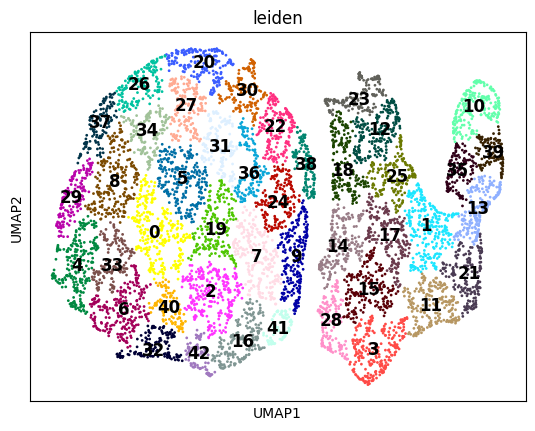

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


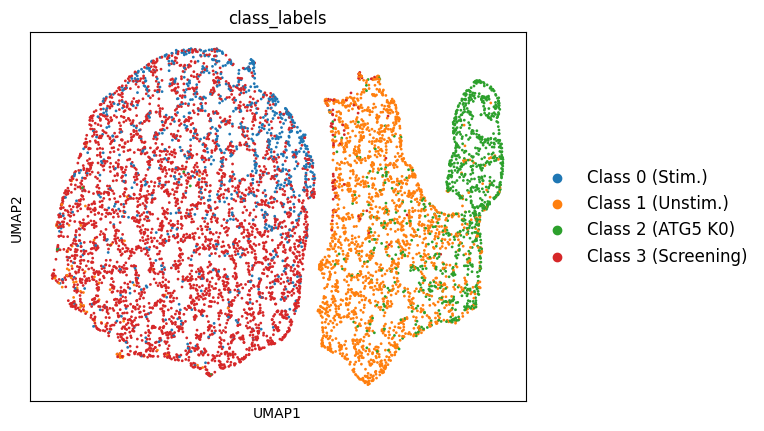

In [64]:
sc.pl.umap(adata, color=['leiden'], cmap=cmap_leiden, legend_loc='on data', legend_fontsize=12)
sc.pl.umap(adata, color=['class_labels'], cmap=cmap_class_labels, legend_loc='right margin', legend_fontsize=12)

We note that screening behaves like class 0 with some overlay but also with some seperateness! We want to have a closer look at the screening cells next.

In [65]:
# Get the cell IDs of screening class 3 cells from the subset
screening_cells = adata[adata.obs['class_labels'] == 'Class 3 (Screening)'].obs_names
print("Cell IDs of screening class 3 cells:")
print(screening_cells)

Cell IDs of screening class 3 cells:
Index(['3', '6', '8', '12', '16', '19', '21', '22', '23', '24',
       ...
       '7585', '7586', '7587', '7588', '7589', '7591', '7594', '7595', '7596',
       '7598'],
      dtype='object', length=3654)


In [66]:
# Subset adata to include only the selected Leiden clusters
selected_clusters = ["23", "12", "18", "25", "14", "17", "15", "28", "3", "1", "11", "21", "13", "39", "35", "10"]
adata_subset = adata[adata.obs['leiden'].isin(selected_clusters)]

# Get the cell IDs of screening class 3 cells within the subset
screening_indices = adata_subset[adata_subset.obs['class_labels'] == 'Class 3 (Screening)'].obs_names

# Print the cell IDs of screening class 3 cells within the selected Leiden clusters
print("Cell indices of screening class 3 cells within the selected Leiden clusters:")
print(screening_indices)

# Calculate the number of resulting screening indices
num_screening_indices = len(screening_indices)
print("Number of screening indices:", num_screening_indices)

Cell indices of screening class 3 cells within the selected Leiden clusters:
Index(['241', '338', '426', '492', '498', '505', '703', '733', '880', '915',
       '1177', '1278', '1394', '1495', '1585', '1605', '1776', '1896', '1950',
       '2109', '2185', '2195', '2296', '2342', '2482', '2553', '2599', '2674',
       '3185', '3296', '3552', '3727', '4038', '4432', '4634', '4663', '4718',
       '4720', '4895', '4933', '4956', '4976', '5004', '5051', '5128', '5146',
       '5165', '5166', '5286', '5413', '5609', '5718', '5763', '5782', '5811',
       '5853', '5863', '6079', '6082', '6106', '6176', '6263', '6325', '6340',
       '6405', '6487', '6707', '6774', '6791', '6899', '7089', '7116', '7171',
       '7258'],
      dtype='object')
Number of screening indices: 74


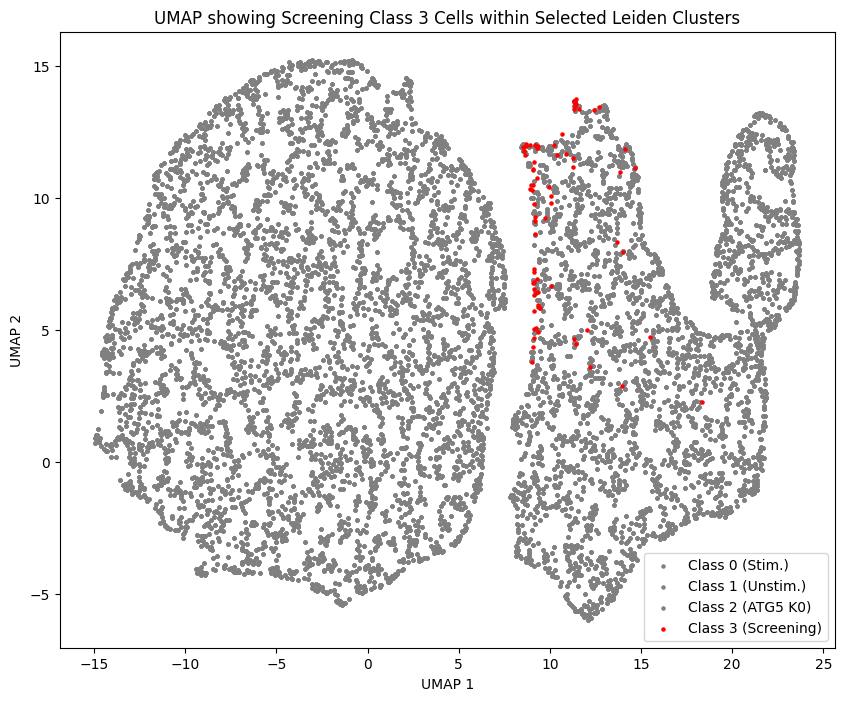

In [67]:
# Define colors for class labels
colors = {'Class 0 (Stim.)': 'grey', 
          'Class 1 (Unstim.)': 'grey', 
          'Class 2 (ATG5 K0)': 'grey', 
          'Class 3 (Screening)': 'red'}

#filter only screening class 3 cells within selected Leiden clusters and plot UMAP
mask = (adata.obs['class_labels'] == 'Class 3 (Screening)') & (adata.obs['leiden'].isin(selected_clusters))
plt.figure(figsize=(10, 8))
for label, color in colors.items():
    if label == 'Class 3 (Screening)':
        plt.scatter(adata.obsm['X_umap'][mask, 0], adata.obsm['X_umap'][mask, 1], c=color, label=label, s=5)
    else:
        plt.scatter(adata.obsm['X_umap'][~mask, 0], adata.obsm['X_umap'][~mask, 1], c=color, label=label, s=5)

plt.title('UMAP showing Screening Class 3 Cells within Selected Leiden Clusters')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend()
plt.show()

In [4]:
screening_indices = ['241', '338', '426', '492', '498', '505', '703', '733', '880', '915',
       '1177', '1278', '1394', '1495', '1585', '1605', '1776', '1896', '1950',
       '2109', '2185', '2195', '2296', '2342', '2482', '2553', '2599', '2674',
       '3185', '3296', '3552', '3727', '4038', '4432', '4634', '4663', '4718',
       '4720', '4895', '4933', '4956', '4976', '5004', '5051', '5128', '5146',
       '5165', '5166', '5286', '5413', '5609', '5718', '5763', '5782', '5811',
       '5853', '5863', '6079', '6082', '6106', '6176', '6263', '6325', '6340',
       '6405', '6487', '6707', '6774', '6791', '6899', '7089', '7116', '7171',
       '7258']

# Convert cell IDs to indices
screening_indices = [int(idx) for idx in screening_indices]
print(len(screening_indices))

# Just double-checking here...
# Obtain data for screening cells and print infos
screening_cells_data = [case1_hdf5_test_data[idx] for idx in screening_indices]
for idx, sample in zip(screening_indices, screening_cells_data):
    print(f"Cell ID: {idx}")
    #print(f"Data: {sample[0]}")  # Acces data
    print(f"Label: {sample[1]}")  # Access label
    if len(sample) == 3:
        print(f"ID: {sample[2]}")  # Access ID if available
    print("="*20)

74
Cell ID: 241
Label: 1
Cell ID: 338
Label: 1
Cell ID: 426
Label: 1
Cell ID: 492
Label: 1
Cell ID: 498
Label: 1
Cell ID: 505
Label: 1
Cell ID: 703
Label: 1
Cell ID: 733
Label: 1
Cell ID: 880
Label: 1
Cell ID: 915
Label: 1
Cell ID: 1177
Label: 1
Cell ID: 1278
Label: 1
Cell ID: 1394
Label: 1
Cell ID: 1495
Label: 1
Cell ID: 1585
Label: 1
Cell ID: 1605
Label: 1
Cell ID: 1776
Label: 1
Cell ID: 1896
Label: 1
Cell ID: 1950
Label: 1
Cell ID: 2109
Label: 1
Cell ID: 2185
Label: 1
Cell ID: 2195
Label: 1
Cell ID: 2296
Label: 1
Cell ID: 2342
Label: 1
Cell ID: 2482
Label: 1
Cell ID: 2553
Label: 1
Cell ID: 2599
Label: 1
Cell ID: 2674
Label: 1
Cell ID: 3185
Label: 1
Cell ID: 3296
Label: 1
Cell ID: 3552
Label: 1
Cell ID: 3727
Label: 1
Cell ID: 4038
Label: 1
Cell ID: 4432
Label: 1
Cell ID: 4634
Label: 1
Cell ID: 4663
Label: 1
Cell ID: 4718
Label: 1
Cell ID: 4720
Label: 1
Cell ID: 4895
Label: 1
Cell ID: 4933
Label: 1
Cell ID: 4956
Label: 1
Cell ID: 4976
Label: 1
Cell ID: 5004
Label: 1
Cell ID: 5051
Labe

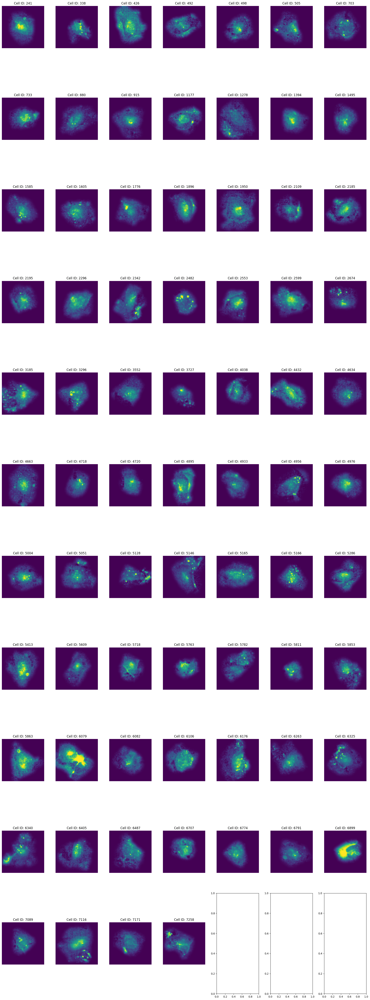

In [86]:
num_screening_indices = len(screening_indices)
plots_per_row = 7
num_rows = (num_screening_indices + plots_per_row - 1) // plots_per_row
fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(20, 5*num_rows))

# Iterate over the screening cells and plot the images
for i, (idx, sample) in enumerate(zip(screening_indices, screening_cells_data), 1):
    # Convert 1-channel image to 2D array for visualization
    image = sample[0][0]
    
    # Calculate the row and column indices for the subplot grid
    row_idx = (i - 1) // plots_per_row
    col_idx = (i - 1) % plots_per_row
    
    # Plot the image
    axes[row_idx, col_idx].imshow(image, cmap='viridis') 
    axes[row_idx, col_idx].set_title(f"Cell ID: {idx}")
    axes[row_idx, col_idx].axis('off')
plt.tight_layout()
plt.show()

## V.  Calculate Classification scores for a) MultiClassClassifier and b) Original autophagy_classifier_2_1 for comparison <a class="anchor" id="scores"></a>

#### a) MultiClassClassifier

We note that there are 74 clear screening hits (red, Class 3 dots in orange, Class 1 region). Would be exciting to get them coloured by classification score of the classifier. Also, getting the cell ids of these cells is of interest in order for us to double-chekc if these cells have already been excised or not.

In [ ]:
# Calculate Classification Scores

# Load the subset indices from the file
subset_indices = torch.load('Case_1_subset_indices.pth')

# Create a new subset sampler with the loaded indices
subset_sampler = SubsetRandomSampler(subset_indices)

# Define the size of the subset!!! (not full dataset here due to kernal crahsing!)
subset_size = 7600 

#Set batch size
batch_size = 512

# Create a new DataLoader for the subset
subset_data_loader = DataLoader(case1_hdf5_test_data, batch_size=batch_size, sampler=subset_sampler)

classification_scores = []

with torch.no_grad():
    for data, labels in tqdm(subset_data_loader, desc="Calculating Scores", leave=False):
        data = data.to(device)
        logits = model(data)
        probabilities = torch.softmax(logits, dim=1)
        classification_scores.append(probabilities.cpu().detach().numpy())

# Concatenate classification scores from all batches
classification_scores = np.concatenate(classification_scores, axis=0)
classification_scores

Each row in the array corresponds to a data point, and each column represents the score for a specific class. First value is score for Class 0, second for class 1 and third for class 2.

Higher values indicate higher confidence in the classification for a particular class.
Lower values indicate lower confidence or likelihood of the data point belonging to a specific class.
In each row, the sum of the scores across all classes should be 1, as the scores are obtained by applying a softmax function to the output logits of the model.

In [8]:
# Save classification scores to a file
np.save('Case1_classification_scores.npy', classification_scores)

In [55]:
classification_scores = np.load('Case1_classification_scores.npy')
classification_scores

array([[1.2206716e-16, 2.2371104e-02, 9.7762889e-01],
       [0.0000000e+00, 9.9576782e-06, 9.9998999e-01],
       [2.2011351e-12, 5.5681929e-02, 9.4431812e-01],
       ...,
       [1.7992289e-18, 9.7758728e-01, 2.2412723e-02],
       [8.3939907e-05, 3.1406206e-01, 6.8585396e-01],
       [7.6283855e-15, 1.8154556e-02, 9.8184550e-01]], dtype=float32)

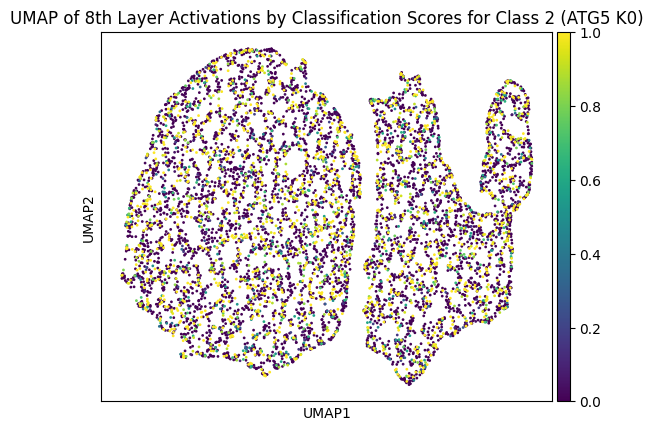

In [73]:
# Determine the class index from the classification scores index
class_index = 2 
class_label = class_labels[class_index]
title = f'UMAP of 8th Layer Activations by Classification Scores for {class_label}'

# Plot in UMAP
adata.obs['classification_scores'] = classification_scores[:, class_index]
sc.pl.umap(adata, color=['classification_scores'], cmap='viridis', legend_loc='right margin', legend_fontsize=12, title=title)

Now we only want to see the class 3 screening results:

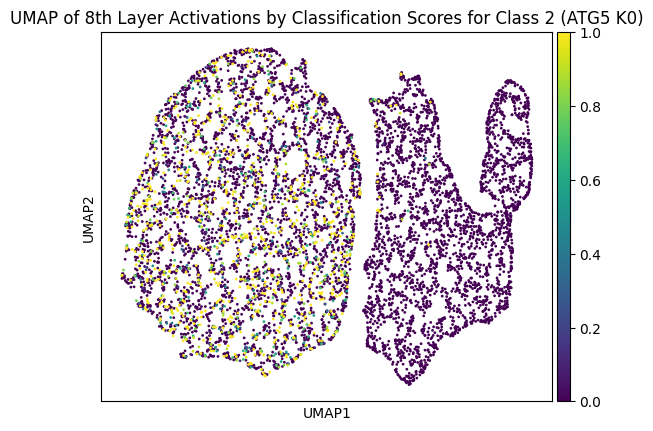

In [76]:
# Determine the class index from the classification scores index
class_index = 2 
class_label = class_labels[class_index]
title = f'UMAP of 8th Layer Activations by Classification Scores for {class_label}'

#color only class 3 screening cells
is_class_3_screening = adata.obs['class_labels'] == 'Class 3 (Screening)'

# hold the classification scores for class 3 screening cells and plot in UMAP
classification_scores_class_3_screening = np.zeros_like(classification_scores[:, class_index])
classification_scores_class_3_screening[is_class_3_screening] = classification_scores[is_class_3_screening, class_index]
adata.obs['classification_scores_class_3_screening'] = classification_scores_class_3_screening
sc.pl.umap(adata, color=['classification_scores_class_3_screening'], cmap='viridis', legend_loc='right margin', legend_fontsize=12, title=title)

Same plots but using matplotlib's UMAP this time:

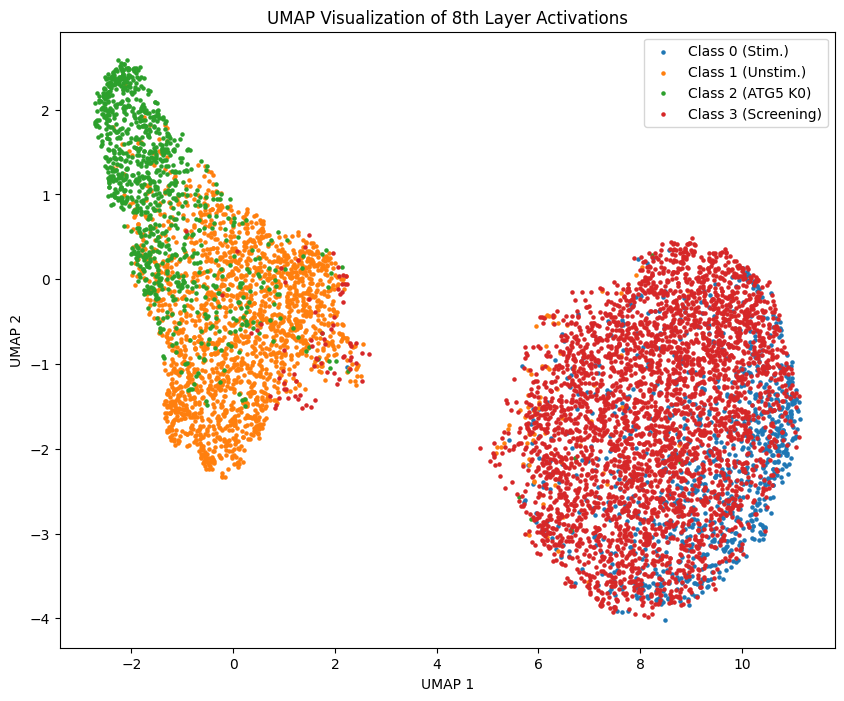

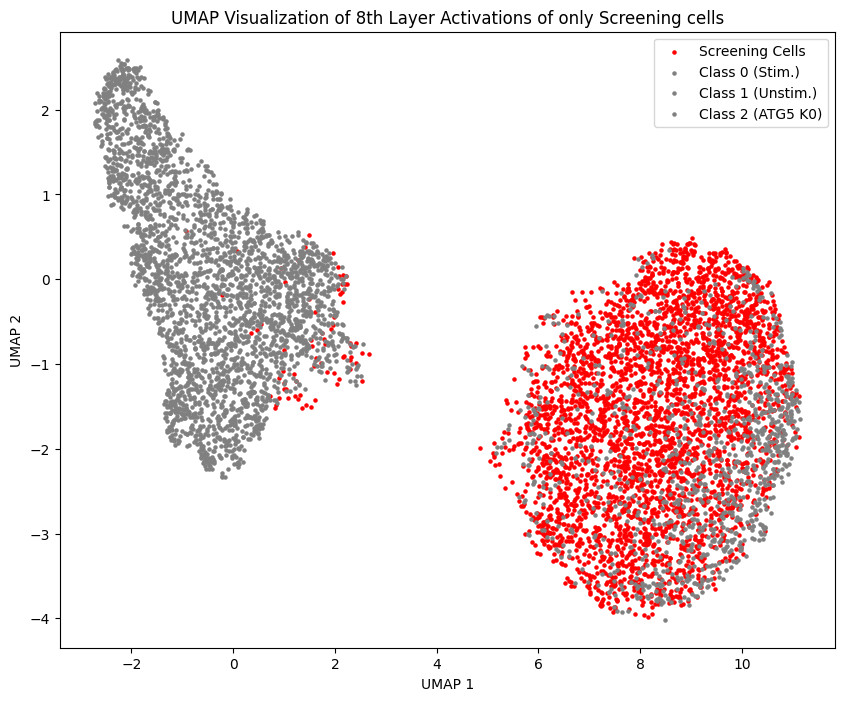

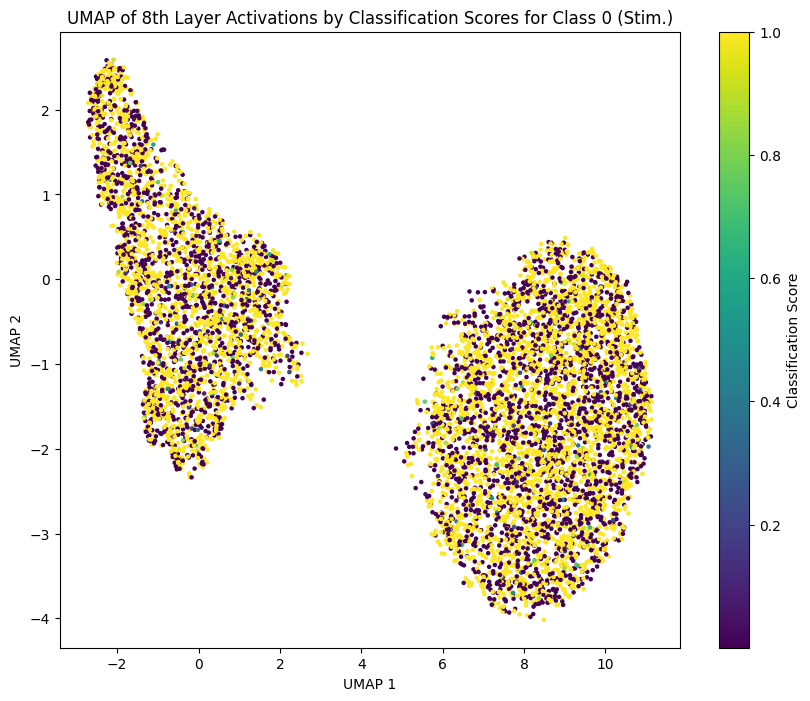

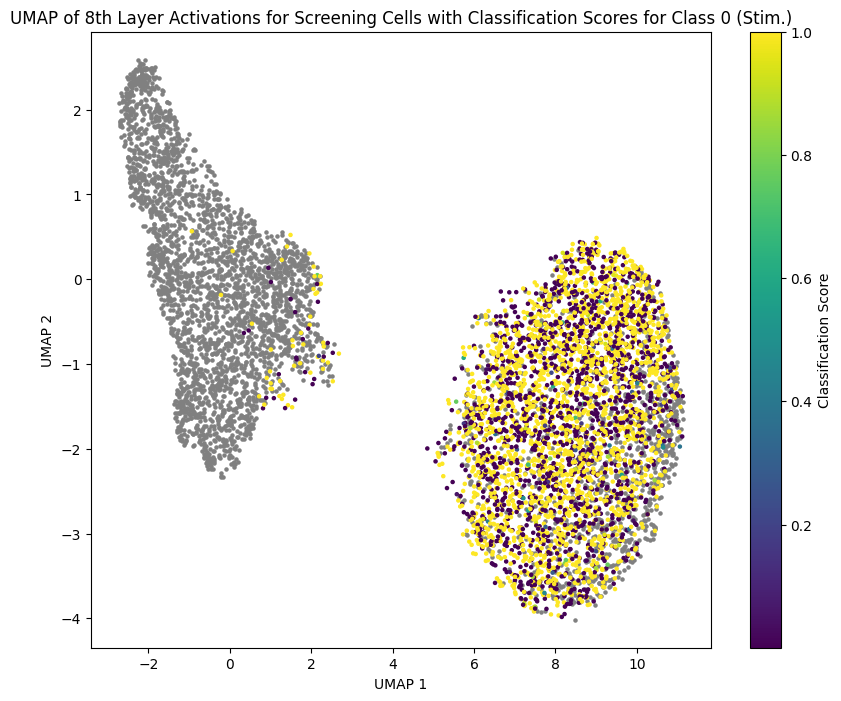

In [30]:
#Plotting UMAP using scatterplot instead of via scanpy
plt.figure(figsize=(10, 8))
for i, label in enumerate(class_labels):
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], label=label, s=5)
plt.legend()
plt.title('UMAP Visualization of 8th Layer Activations')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()
plt.figure(figsize=(10, 8))

# Plot cells belonging to class 3 (screening) with red color
screening_idx = labels == 3
plt.scatter(umap_result[screening_idx, 0], umap_result[screening_idx, 1], color='red', label='Screening Cells', s=5)

# Plot cells belonging to other classes in grey
for i, label in enumerate(class_labels[:-1]):  # Exclude the last class (screening)
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], color='grey', label=label, s=5)

plt.legend()
plt.title('UMAP Visualization of 8th Layer Activations of only Screening cells')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

# Determine the class index from the classification scores index
class_index = 0 
class_label = class_labels[class_index]
title = f'UMAP of 8th Layer Activations by Classification Scores for {class_label}'

# Plot UMAP with cells colored by classification score
plt.figure(figsize=(10, 8))
plt.scatter(umap_result[:, 0], umap_result[:, 1], c=classification_scores[:, class_index], cmap='viridis', s=5)
plt.colorbar(label='Classification Score')
plt.title(title)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

class_index = 0
plt.figure(figsize=(10, 8))

# Plot cells belonging to class 3 (screening) with color based on classification score
for i, label in enumerate(class_labels[:-1]): 
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], color='grey', label=label, s=5)

# Color the screening cells based on their classification score
cmap = plt.get_cmap('viridis')
screening_scores = classification_scores[screening_idx]
plt.scatter(umap_result[screening_idx, 0], umap_result[screening_idx, 1], c=screening_scores[:, class_index], cmap=cmap, label='Screening Cells', s=5)
cbar = plt.colorbar()
cbar.set_label('Classification Score')

  
class_label = class_labels[class_index]
title = f'UMAP of 8th Layer Activations for Screening Cells with Classification Scores for {class_label}'

plt.title(title)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

#### b) autophagy_classifier_2_1 classification scores

We now want to check the classification score using the binary classifier from the preprint (autophagy_classifier_2_1) because that is biologically validated and at the same time corresponds to what we already know about the data. We now want to compare these classification scores we just computed from the MultiClassClassifier to the autophagy_classifier_2_1 scores. Our hope would be that it learned something the original classifier did not, thereby identifying something new...

In [5]:
#Load pretrained model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [6]:
checkpoint_path = "VGG2_autophagy_classifier2.1.cpkt"
checkpoint = torch.load(checkpoint_path)
print(checkpoint.keys())

dict_keys(['epoch', 'global_step', 'pytorch-lightning_version', 'state_dict', 'callbacks', 'optimizer_states', 'lr_schedulers', 'hparams_name', 'hyper_parameters'])


In [7]:
model = autophagy_classifier2_1(device)
model.load_state_dict(torch.load(checkpoint_path)['state_dict'])
model.to(device)
model.eval()

Lightning automatically upgraded your loaded checkpoint from v1.5.5 to v2.0.7. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../../../../workspace/SPARCSpy/src/pretrained_models/autophagy/autophagy2.1/VGG2_autophagy_classifier2.1.cpkt`


MultilabelSupervisedModel(
  (network): _VGG2(
    (norm): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (softmax): LogSoftmax(dim=1)
    (features): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): ReLU(inplace=True)
      (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU(inplace=True)
      (11): Conv2d(256, 256, k

In [65]:
# Load the checkpoint
checkpoint_path = "VGG2_autophagy_classifier2.1.cpkt"
checkpoint = torch.load(checkpoint_path)
print(checkpoint.keys())

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize and load model
model = autophagy_classifier2_1(device)
model.load_state_dict(checkpoint['state_dict'])
model.to(device)
model.eval()

# Load the subset indices
subset_indices = torch.load('Case_1_subset_indices.pth')

# Create a SubsetRandomSampler
subset_sampler = SubsetRandomSampler(subset_indices)

# Define the subset size and batch size
subset_size = 7600
batch_size = 512

# Create a DataLoader for the subset
subset_data_loader = DataLoader(case1_hdf5_test_data, batch_size=batch_size, sampler=subset_sampler)

classification_scores = []
out_labels = []

# Calculate Classification Scores
with torch.no_grad():
    for data, labels in tqdm(subset_data_loader, desc="Calculating Scores", leave=False):
        data = data.to(device)
        logits = model(data)
        probabilities = torch.softmax(logits, dim=1)
        classification_scores.append(probabilities.cpu().detach().numpy())
        out_labels.append(labels.cpu().detach())

# Concatenate classification scores and labels from all batches
classification_scores = np.concatenate(classification_scores, axis=0)

Lightning automatically upgraded your loaded checkpoint from v1.5.5 to v2.0.7. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../../../../workspace/SPARCSpy/src/pretrained_models/autophagy/autophagy2.1/VGG2_autophagy_classifier2.1.cpkt`


dict_keys(['epoch', 'global_step', 'pytorch-lightning_version', 'state_dict', 'callbacks', 'optimizer_states', 'lr_schedulers', 'hparams_name', 'hyper_parameters'])


Calculating Scores:   0%|          | 0/15 [00:00<?, ?it/s]

In [66]:
# Save classification scores to a file
np.save('Case1_pretrained_original_autophagy_2_1_classification_scores.npy', classification_scores)

# Save out_labels as torch tensor
torch.save(out_labels, 'Case1_pretrained_original_autophagy_2_1_out_labels.pth')

In [2]:
# Load scores and labels
classification_scores = np.load('Case1_pretrained_original_autophagy_2_1_classification_scores.npy')
out_labels = torch.load('Case1_pretrained_original_autophagy_2_1_out_labels.pth')

NameError: name 'torch' is not defined

Here we plot the autophagy_2_1 scores in UMAPs:

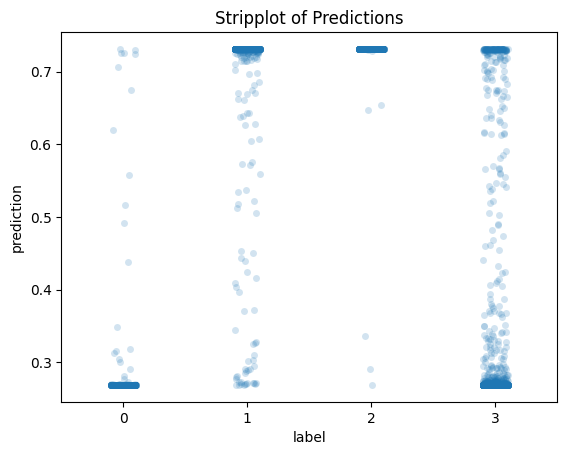

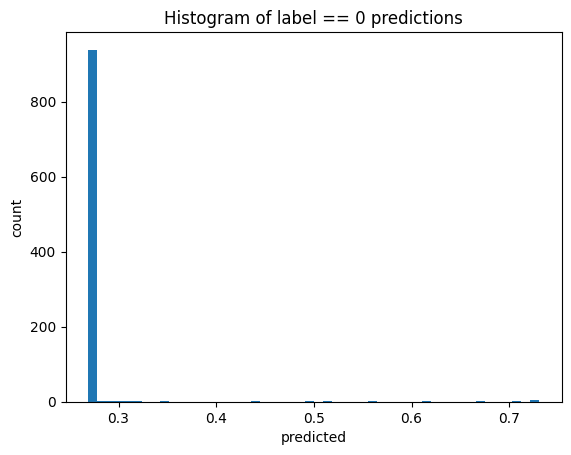

In [69]:
reform_labels = torch.hstack(out_labels)
reform_res = torch.tensor(classification_scores).softmax(dim=1)[:, 1]

#Strip Plot
sns.stripplot(x=reform_labels.numpy(), y=reform_res.numpy(), alpha=0.2)
plt.xlabel('label')
plt.ylabel('prediction')
plt.title('Stripplot of Predictions')
plt.show()

# Histogram
plt.hist(reform_res[reform_labels == 0].numpy(), bins=50)
plt.title('Histogram of label == 0 predictions')
plt.xlabel('predicted')
plt.ylabel('count')
plt.show()

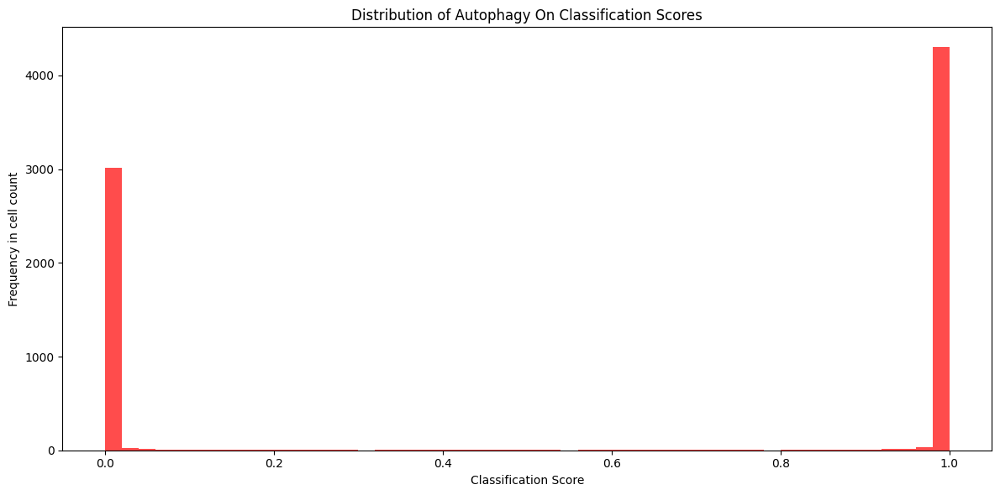

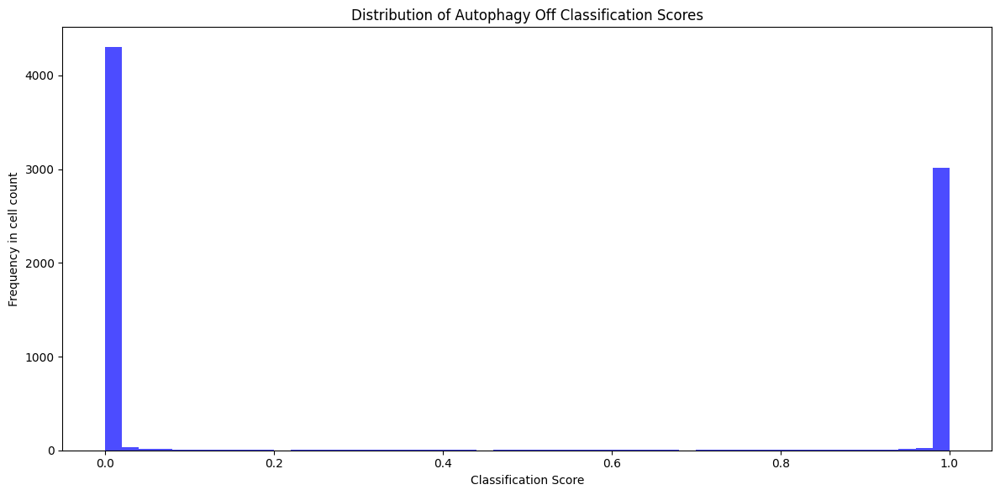

In [81]:
# Extract scores for autophagy on and off
autophagy_on_scores = classification_scores[:, 0]
autophagy_off_scores = classification_scores[:, 1]

# Plot for autophagy on
plt.figure(figsize=(12, 6))
plt.hist(autophagy_on_scores, bins=50, color='red', alpha=0.7)
plt.title('Distribution of Autophagy On Classification Scores')
plt.xlabel('Classification Score')
plt.ylabel('Frequency in cell count')
plt.tight_layout()
plt.show()

# Plot for autophagy off
plt.figure(figsize=(12, 6))
plt.hist(autophagy_off_scores, bins=50, color='blue', alpha=0.7)
plt.title('Distribution of Autophagy Off Classification Scores')
plt.xlabel('Classification Score')
plt.ylabel('Frequency in cell count')
plt.tight_layout()
plt.show()

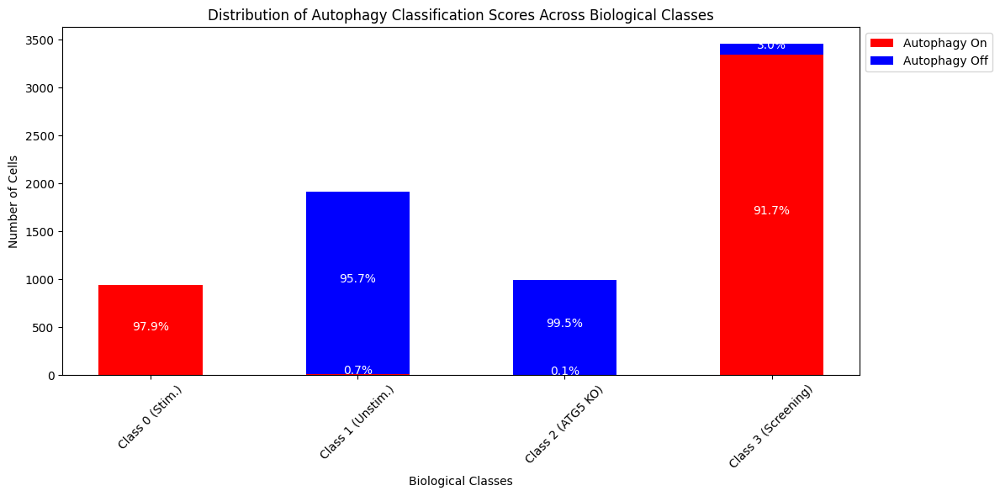

In [80]:
# Verify shape
assert classification_scores.shape[0] == reform_labels.shape[0], "Mismatch in number of samples between classification scores and labels"

# Initialize a dictionary to store counts for each biological class and autophagy label
counts = {bio_label: [0, 0] for bio_label in biological_class_labels}
percentages = {bio_label: [0.0, 0.0] for bio_label in biological_class_labels}

# Count the number of cells in each biological class with autophagy on or off
for i, bio_label in enumerate(biological_class_labels):
    class_indices = (reform_labels == i).numpy()  # convert tensor to numpy for indexing
    total_count = np.sum(class_indices)
    autophagy_on_count = np.sum(classification_scores[class_indices, 0] > 0.98)  # Threshold for 'Autophagy on'
    autophagy_off_count = np.sum(classification_scores[class_indices, 1] > 0.98)  # Threshold for 'Autophagy off'
    counts[bio_label] = [autophagy_on_count, autophagy_off_count]
    if total_count > 0:
        percentages[bio_label] = [autophagy_on_count / total_count * 100, autophagy_off_count / total_count * 100]

# Extract counts for plotting
bio_classes = list(counts.keys())
autophagy_on_counts = [counts[bio_label][0] for bio_label in bio_classes]
autophagy_off_counts = [counts[bio_label][1] for bio_label in bio_classes]

plt.figure(figsize=(12, 6))
bar_width = 0.5
indices = np.arange(len(bio_classes))

plt.bar(indices, autophagy_on_counts, bar_width, label='Autophagy On', color='red')
plt.bar(indices, autophagy_off_counts, bar_width, bottom=autophagy_on_counts, label='Autophagy Off', color='blue')

# Add percentages to plot
for i, bio_label in enumerate(bio_classes):
    total = autophagy_on_counts[i] + autophagy_off_counts[i]
    if total > 0:
        plt.text(i, autophagy_on_counts[i] / 2, f'{percentages[bio_label][0]:.1f}%', ha='center', color='white')
        plt.text(i, autophagy_on_counts[i] + autophagy_off_counts[i] / 2, f'{percentages[bio_label][1]:.1f}%', ha='center', color='white')

plt.xlabel('Biological Classes')
plt.ylabel('Number of Cells')
plt.title('Distribution of Autophagy Classification Scores Across Biological Classes')
plt.xticks(indices, bio_classes, rotation=45)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

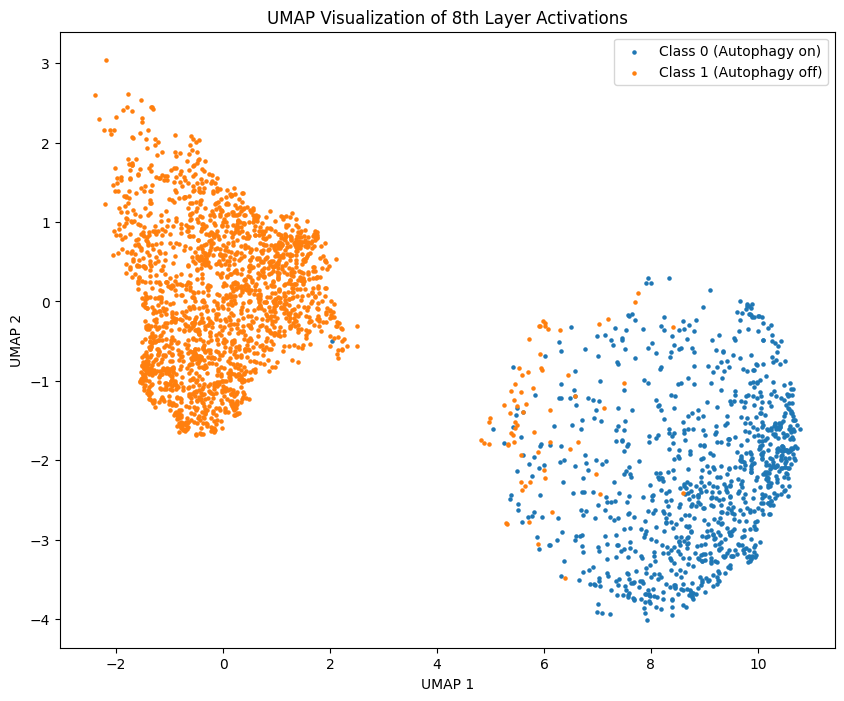

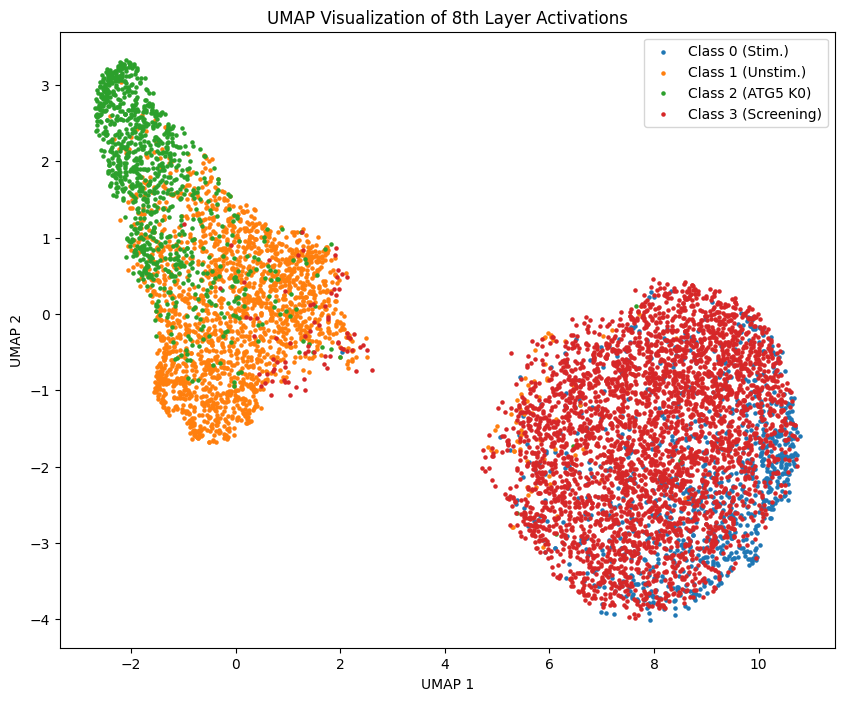

<Figure size 1000x800 with 0 Axes>

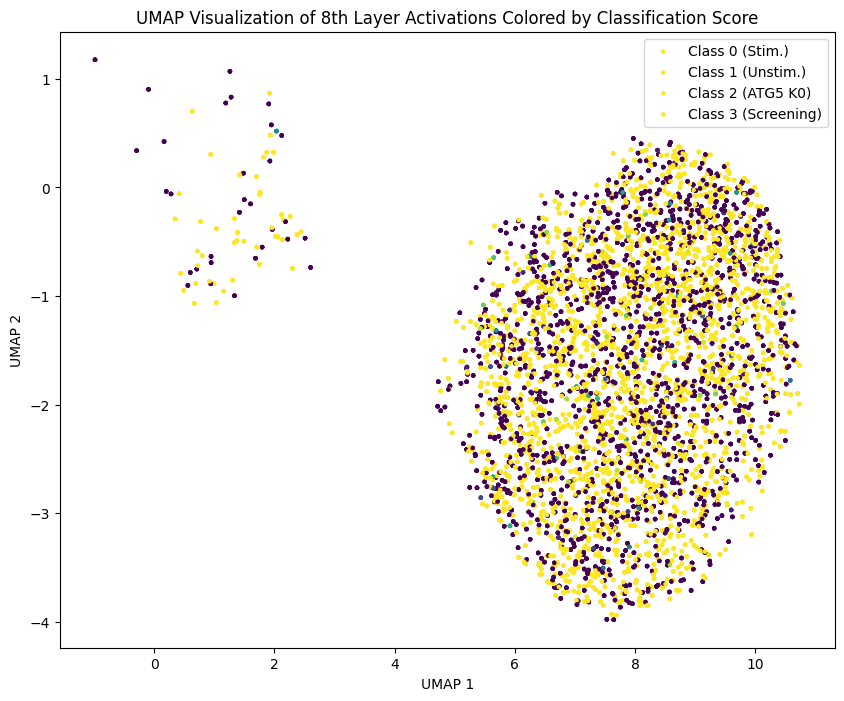

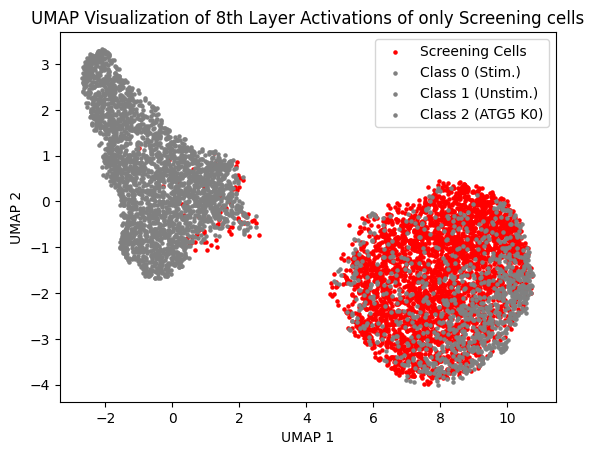

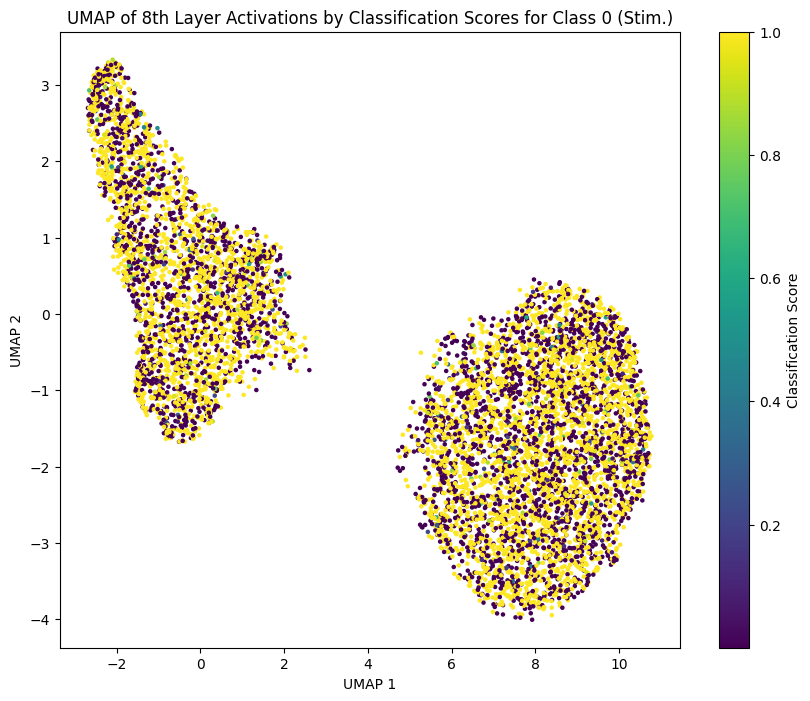

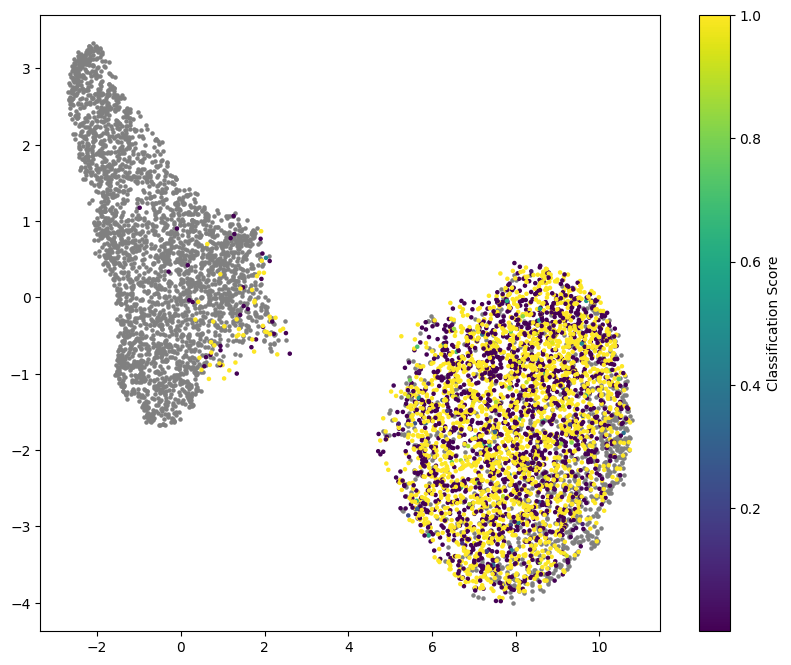

In [95]:
class_indices = [0, 1]  # Autophagy on or off
class_labels = ["Class 0 (Autophagy on)", "Class 1 (Autophagy off)"]
num_classes = len(class_labels)

#class_labels

#Plotting UMAP using scatterplot instead of via scanpy
plt.figure(figsize=(10, 8))
for i, label in enumerate(class_labels):
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], label=label, s=5)
plt.legend()
plt.title('UMAP Visualization of 8th Layer Activations')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()


# Define class labels
class_labels = ["Class 0 (Stim.)", "Class 1 (Unstim.)", "Class 2 (ATG5 K0)", "Class 3 (Screening)"]


#Plotting UMAP using scatterplot instead of via scanpy
plt.figure(figsize=(10, 8))
for i, label in enumerate(class_labels):
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], label=label, s=5)
plt.legend()
plt.title('UMAP Visualization of 8th Layer Activations')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()
plt.figure(figsize=(10, 8))


# Plot UMAP with cells colored by classification score
plt.figure(figsize=(10, 8))
cmap = plt.get_cmap('viridis')  # Choose colormap (you can change it if needed)
for i, label in enumerate(class_labels):
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], c=classification_scores[idx, 0], cmap=cmap, label=label, s=5)

plt.title('UMAP Visualization of 8th Layer Activations Colored by Classification Score')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend()
plt.show()


# Plot cells belonging to class 3 (screening) with red color
screening_idx = labels == 3
plt.scatter(umap_result[screening_idx, 0], umap_result[screening_idx, 1], color='red', label='Screening Cells', s=5)

# Plot cells belonging to other classes in grey
for i, label in enumerate(class_labels[:-1]):  # Exclude the last class (screening)
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], color='grey', label=label, s=5)

plt.legend()
plt.title('UMAP Visualization of 8th Layer Activations of only Screening cells')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

# Determine the class index from the classification scores index
class_index = 0 
class_label = class_labels[class_index]
title = f'UMAP of 8th Layer Activations by Classification Scores for {class_label}'

# Plot UMAP with cells colored by classification score
plt.figure(figsize=(10, 8))
plt.scatter(umap_result[:, 0], umap_result[:, 1], c=classification_scores[:, class_index], cmap='viridis', s=5)
plt.colorbar(label='Classification Score')
plt.title(title)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

class_index = 0
plt.figure(figsize=(10, 8))

# Plot cells belonging to class 3 (screening) with color based on classification score
for i, label in enumerate(class_labels[:-1]): 
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], color='grey', label=label, s=5)

# Color the screening cells based on their classification score
cmap = plt.get_cmap('viridis')
screening_scores = classification_scores[screening_idx]
plt.scatter(umap_result[screening_idx, 0], umap_result[screening_idx, 1], c=screening_scores[:, class_index], cmap=cmap, label='Screening Cells', s=5)
cbar = plt.colorbar()
cbar.set_label('Classification Score')

Now we want to annotate the images based on the autophagy_2_1 classifier results.

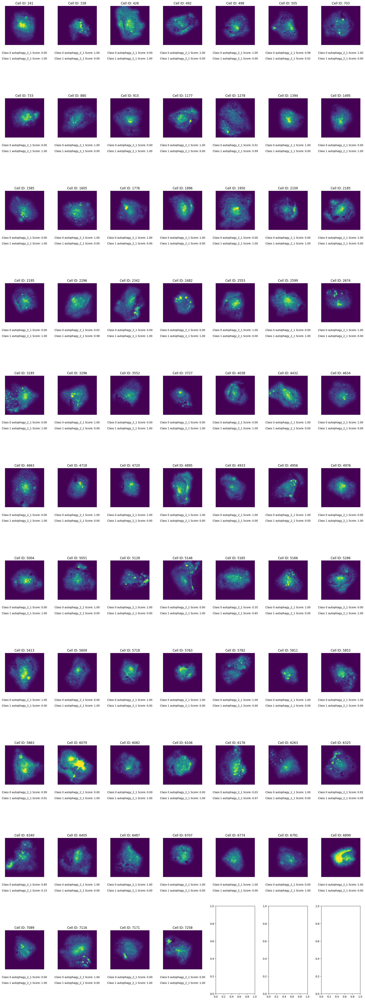

In [82]:
# Define the number of screening indices
num_screening_indices = len(screening_indices)

plots_per_row = 7
num_rows = (num_screening_indices + plots_per_row - 1) // plots_per_row
fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(20, 5*num_rows))

# Iterate over the screening cells and plot the images
for i, (idx, sample, scores) in enumerate(zip(screening_indices, screening_cells_data, classification_scores), 1):
    image = sample[0][0]  
    
    # Calculate the row and column indices for the subplot grid
    row_idx = (i - 1) // plots_per_row
    col_idx = (i - 1) % plots_per_row
    
    # Plot the image
    axes[row_idx, col_idx].imshow(image, cmap='viridis')
    axes[row_idx, col_idx].set_title(f"Cell ID: {idx}")
    axes[row_idx, col_idx].axis('off')
    
    # Add classification scores as text
    axes[row_idx, col_idx].text(0.5, -0.2, f"Class 0 autophagy_2_1 Score: {scores[0]:.2f}", horizontalalignment='center', verticalalignment='center', transform=axes[row_idx, col_idx].transAxes)
    axes[row_idx, col_idx].text(0.5, -0.35, f"Class 1 autophagy_2_1 Score: {scores[1]:.2f}", horizontalalignment='center', verticalalignment='center', transform=axes[row_idx, col_idx].transAxes)
plt.tight_layout()
plt.show()

A high classification score in class 1 coming from the autophagy_2_1 classifier means autophagy-off, so a hit that we already knew.

In [71]:
#Save the adata
adata.write('Case1_adata.h5ad')

In [ ]:
adata = sc.read_h5ad("Case1_adata.h5ad")